In [1]:
import os
import sys
import time
import datetime
import netCDF4
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import seaborn as sns

from pathlib import Path
from sklearn.cluster import DBSCAN

In [2]:
colnms = [
    'Oa01_reflectance:float',
    'Oa02_reflectance:float',
    'Oa03_reflectance:float',
    'Oa04_reflectance:float',
    'Oa05_reflectance:float',
    'Oa06_reflectance:float',
    'Oa07_reflectance:float',
    'Oa08_reflectance:float',
    'Oa09_reflectance:float',
    'Oa10_reflectance:float',
    'Oa11_reflectance:float',
    'Oa12_reflectance:float',
    'Oa16_reflectance:float',
    'Oa17_reflectance:float',
    'Oa18_reflectance:float',
    'Oa21_reflectance:float'
]

s3bands = [
    'B1-400',
    'B2-412.5',
    'B3-442.5',
    'B4-490',
    'B5-510',
    'B6-560',
    'B7-620',
    'B8-665',
    'B9-673.75',
    'B10-681.25',
    'B11-708.75',
    'B12-753.75',
    'B16-778.75',
    'B17-865',
    'B18-885',
    'B21-1020'
]

# s3bands = [400, 412.5, 442, 490, 510, 560, 620, 665, 674, 681, 709, 754, 779, 865, 885, 1020]

In [3]:
def datafolder_2_list(path):
    return [f for f in path.iterdir() if f.suffix == '.csv']


def open_radiometry(path):
    old_names = [f'Oa{str(i).zfill(2)}_reflectance:float' for i in range(1, 22)]
    [old_names.remove(f'Oa{str(i).zfill(2)}_reflectance:float') for i in range(13,16)]
    [old_names.remove(f'Oa{str(i).zfill(2)}_reflectance:float') for i in range(19,21)]
    df = pd.read_csv(path).rename(columns={old_names[i]: s3bands[i] for i in range(16)})    
    return df


def normalize(df, bands, norm_band):
    df = df.copy()
    df[bands] = df[bands].to_numpy() - df[norm_band].to_numpy()[..., None]
    return df


def clip_negatives(df, bands, threshold=-0.1):
    return df.loc[~((df[bands] < -0.1).any(axis=1))]


def clean_radiometry(df, min_threshold=-0.1, norm_band='B21-1020'):

    if norm_band is not None:
        df = normalize(df, s3bands, 'B21-1020')

    df = clip_negatives(df, s3bands, -0.1)

    return df


def load_radiometries(path, min_pixels=3):

    csvs = [f for f in path.iterdir()]

    radiometries = {}

    for i, csv in enumerate(csvs):
        df = open_radiometry(csvs[i])
        if len(df) > min_pixels:
            radiometries[csv.stem[16:24]] = df
            
    return radiometries


def calc_nd_index(df, band1, band2, column_name='nd_index'):
    idx = (df[band1]-df[band2])/(df[band1]+df[band2])
    df[column_name] = idx
    
    
def db_scan(df, bands, column_name='cluster', eps=0.1, min_samples=5):
    clustering = DBSCAN(eps=eps, min_samples=min_samples).fit(df[bands])
    df[column_name] = clustering.labels_
    

def power(x, a, b, c):return a*(x)**(b) + c


def SPM_GET_Amazon(b665, b865, cutoff_value=0.027, cutoff_delta=0.007, low_params=None, high_params=None, debug=False):

    if debug:
        pdb.set_trace()

    if cutoff_delta == 0:
        transition_coef = np.where(b665<=cutoff_value, 0, 1)

    else:
        transition_range = (cutoff_value - cutoff_delta, cutoff_value + cutoff_delta)
        transition_coef = (b665-transition_range[0])/(transition_range[1]-transition_range[0])

        transition_coef = np.clip(transition_coef, 0, 1)


    # if params are not passed, use default params obtained from the Amazon dataset
    low_params = [2.79101975e+05, 2.34858344e+00, 4.20023206e+00] if low_params is None else low_params
    high_params = [848.97770516,   1.79293191,   8.2788616 ] if high_params is None else high_params

    #low = Fit.power(b665, *low_params).fillna(0)
    #high = Fit.power(b865/b665, *high_params).fillna(0)

    low = power(b665, *low_params).fillna(0)
    high = power(b865/b665, *high_params).fillna(0)


    spm = (1-transition_coef)*low + transition_coef*high
    return spm


# https://stackoverflow.com/questions/29387137/how-to-convert-a-given-ordinal-number-from-excel-to-a-date
def from_excel_ordinal(ordinal, _epoch0=datetime.datetime(1899, 12, 31)):
    if ordinal >= 60:
        ordinal -= 1  # Excel leap year bug, 1900 is not a leap year!
    return (_epoch0 + datetime.timedelta(days=ordinal)).replace(microsecond=0)

In [4]:
import matplotlib
import matplotlib.cm as cm
sys.path.append('../../')
from nc_explorer import NcExplorer

ncxp = NcExplorer()

def s3l2_custom_reflectance_plot(df, figure_title, save_title=None):
    
    colnms = [
        'Oa01_reflectance:float',
        'Oa02_reflectance:float',
        'Oa03_reflectance:float',
        'Oa04_reflectance:float',
        'Oa05_reflectance:float',
        'Oa06_reflectance:float',
        'Oa07_reflectance:float',
        'Oa08_reflectance:float',
        'Oa09_reflectance:float',
        'Oa10_reflectance:float',
        'Oa11_reflectance:float',
        'Oa12_reflectance:float',
        'Oa16_reflectance:float',
        'Oa17_reflectance:float',
        'Oa18_reflectance:float',
        'Oa21_reflectance:float'
    ]
    
#     colnms = [
#         'B1-400',
#         'B2-412.5',
#         'B3-442.5',
#         'B4-490',
#         'B5-510',
#         'B6-560',
#         'B7-620',
#         'B8-665',
#         'B9-673.75',
#         'B10-681.25',
#         'B11-708.75',
#         'B12-753.75',
#         'B16-778.75',
#         'B17-865',
#         'B18-885',
#         'B21-1020'
#     ]

    
    # creating a list of lists containing the reflectance of every band in each df row.
    spectral_lib = []
    for n,i in enumerate(df):
        plotngdata = [df[c].iloc[n] for c in colnms]
        spectral_lib.append(plotngdata)
    
    # creating color scale based on T865
    lst = df['T865:float']
    minima = min(lst)
    maxima = max(lst)
    norm = matplotlib.colors.Normalize(vmin=minima, vmax=maxima, clip=True)
    mapper = cm.ScalarMappable(norm=norm, cmap=cm.viridis)
    
    # create a list with the value in (nm) of the 16 Sentinel-3 bands for L2 products.
    s3_bands_tick = list(ncxp.s3_bands_l2.values())

    # create a list with the name of the 16 Sentinel-3 bands for L2 products.
    s3_bands_tick_label = list(ncxp.s3_bands_l2.keys())    
    
    plt.rcParams['figure.figsize'] = [12, 6] 
    

    fig = plt.figure()
    fig.show()
    ax1 = fig.add_subplot(111)
      
    ax1.set_xlabel('Wavelenght (nm)')
    ax1.set_ylabel('Reflectance')
    ax1.set_title(figure_title, y=1, fontsize=16)

    for n, spec_curve in enumerate(spectral_lib):
        t865c = mapper.to_rgba(df['T865:float'][n])
        ax1.plot(s3_bands_tick, spec_curve, alpha=0.4, c=t865c)

    ax1.axhline(y=0, xmin=0, xmax=1, linewidth=0.5, color='black', linestyle='--')
    ax1.set_xticks(s3_bands_tick)
    ax1.set_xticklabels(s3_bands_tick)
    ax1.tick_params(labelrotation=90, labelsize='small')
#     ax1.legend()

    ax2 = ax1.twiny()
    ax2.plot(s3_bands_tick, [0]*(len(s3_bands_tick)), alpha=0.0)
    ax2.set_xticks(s3_bands_tick)
    ax2.set_xticklabels(s3_bands_tick_label)
    ax2.tick_params(labelrotation=90, labelsize='xx-small')
    ax2.set_title('Sentinel-3 Oa Bands', y=0.93, x=0.12, fontsize='xx-small')
    
    if save_title:
        plt.savefig(save_title, dpi=300)
    else:
        plt.show()

sen3r-NcExplorer: from mpl_toolkits.basemap import Basemap FAILED!
You can still proceed without plotting any maps.

Declaring class instance from: SEN3R:nc_explorer
Input NetCDF file folder not set. Proceed at your own risk.
initialize set to False, ignoring image geometries. This can be later done manually by calling initialize_geometries() after properly setting the nc_folder.


In [ ]:
for date, radiometry in radiometries.items():

        
        valid_mndwi = (radiometry['MNDWI'] > -0.99) & (radiometry['MNDWI'] < 0.99)
        valid_ndwi = (radiometry['NDWI'] > -0.99) & (radiometry['NDWI'] < 0.99)

        radiometry = radiometry[valid_mndwi & valid_ndwi]

        if len(radiometry) < min_samples:
            continue 
        
        db_scan(radiometry, bands, eps=eps, min_samples=min_samples)
        clusters = radiometry.groupby(by='cluster').mean()
        
        if save_folder:
            plt.scatter(radiometry['longitute:float'],radiometry['latitude:float'])
            plt.savefig(save_folder, bbox_inches='tight')
        
        # drop the noise
        clusters.drop(-1, inplace=True, errors='ignore')

        # if there is at least 1 valid cluster
        if len(clusters) > 0:
            df = df.append(clusters[clusters['B21-1020'] == clusters['B21-1020'].min()].iloc[0].rename(date))
        
    
    df['Datestr'] = [f'{i[:4]}-{i[4:6]}-{i[6:]}' for i, row in df.iterrows()]
    df['Date'] = pd.to_datetime(df['Datestr'])
    df.sort_values(by='Date', inplace=True)
    df.reset_index(inplace=True)

In [5]:
def plot_spm_map(df, spm_vertex, title, path2save=None):
    plt.figure(figsize=(18,12))
    for vert in spm_vertex:
        plt.plot(vert[:,0],vert[:,1],c='k')
    plt.scatter(df['longitude:double'], df['latitude:double'], c=df['SPM'], marker='s', cmap='jet', vmin=0, vmax=200)
    plt.title(title)
    cbar = plt.colorbar()
    cbar.set_label('Concentration (mg/L)')
    if path2save:
        plt.savefig(path2save, bbox_inches='tight')
        plt.close()
    else:
        plt.show()

In [6]:
pd.options.mode.chained_assignment = None  # default='warn'

def create_time_series_cluster(radiometries, bands=['B17-865', 'B21-1020'], eps=0.01, min_samples=5, save_folder=None, spm_vertex=None):
    df = pd.DataFrame()

    for date, radiometry in radiometries.items():

        if len(radiometry) < min_samples:
            continue 
        
        if spm_vertex:
            plot_spm_map(df=radiometry,
                         spm_vertex=spm_vertex,
                         title=date,
                         path2save=f'{save_folder/date}_spmap.png')
        
        db_scan(radiometry, bands, eps=eps, min_samples=min_samples)
        clusters = radiometry.groupby(by='cluster').mean()
        
        # drop the noise
        clusters.drop(-1, inplace=True, errors='ignore')

        # if there is at least 1 valid cluster
        if len(clusters) > 0:
            df = df.append(clusters[clusters['B21-1020'] == clusters['B21-1020'].min()].iloc[0].rename(date))
        
    
    df['Datestr'] = [f'{i[:4]}-{i[4:6]}-{i[6:]}' for i, row in df.iterrows()]
    df['Date'] = pd.to_datetime(df['Datestr'])
    df.sort_values(by='Date', inplace=True)
    df.reset_index(inplace=True)
    
    return df

In [7]:
def just_open_radiometry(path):
    df = pd.read_csv(path)    
    return df

In [8]:
def just_load_radiometries(path, min_pixels=3):

    csvs = [f for f in path.iterdir()]

    radiometries = {}

    for i, csv in enumerate(csvs):
        df = just_open_radiometry(csvs[i])
        if len(df) > min_pixels:
            radiometries[csv.stem[16:24]] = df
            
    return radiometries

In [9]:
def plot_scattercluster(event_df, col_x='B17-865', col_y='B8-665', col_color='T865:float', cluster_col='cluster', nx=None, ny=None, mplcolormap='viridis', title=None, savepath=None, dpi=100):
    
    plt.rcParams['figure.figsize'] = [14, 5.2]
    fig, (ax1, ax2) = plt.subplots(1, 2)
    
    if title:
        fig.suptitle(title)

    skt1 = ax1.scatter(event_df[col_x], event_df[col_y], c=event_df[col_color], cmap=mplcolormap)
    cbar = fig.colorbar(skt1, ax=ax1)
    cbar.set_label(col_color)

    # Get unique names of clusters
    uniq = list(set(event_df[cluster_col]))

    # iterate to plot each cluster
    for i in range(len(uniq)):
        indx = event_df[cluster_col] == uniq[i]
        ax2.scatter(event_df[col_x][indx], event_df[col_y][indx], label=uniq[i])
    
    # Add x,y annotation
    if nx:
        ax1.plt.plot(nx, ny,
                     marker='D',
                     markersize=20,
                     markerfacecolor="None",
                     markeredgecolor='k')
    
    ax1.set_xlabel(col_x)
    ax1.set_ylabel(col_y)
    ax2.set_xlabel(col_x)
    
    plt.legend()
    
    if savepath:
        plt.savefig(savepath, dpi=dpi, bbox_inches='tight')
        plt.close(fig)
    else:
        plt.show()

In [10]:
# concentração = 759,12 * (NIR /RED)^1,92
def SPM_MOD(NIR,RED):
    return 759.12*((NIR/RED)**1.92)

In [11]:
def SPM_GETAMZmod(band665, band865, cutoff_value=0.027, cutoff_delta=0.007, low_params=None, high_params=None, debug=False):
    
    b665 = band665/np.pi
    b865 = band865/np.pi
    
    if debug:
        pdb.set_trace()

    if cutoff_delta == 0:
        transition_coef = np.where(b665<=cutoff_value, 0, 1)

    else:
        transition_range = (cutoff_value - cutoff_delta, cutoff_value + cutoff_delta)
        transition_coef = (b665-transition_range[0])/(transition_range[1]-transition_range[0])

        transition_coef = np.clip(transition_coef, 0, 1)


    # if params are not passed, use default params obtained from the Amazon dataset
    low_params = [2.79101975e+05, 2.34858344e+00, 4.20023206e+00] if low_params is None else low_params
    high_params = [848.97770516,   1.79293191,   8.2788616 ] if high_params is None else high_params

    #low = Fit.power(b665, *low_params).fillna(0)
    #high = Fit.power(b865/b665, *high_params).fillna(0)

    low = power(b665, *low_params).fillna(0)
    #high = power(b865/b665, *high_params).fillna(0)
    high = SPM_MOD(b865,b665)


    spm = (1-transition_coef)*low + transition_coef*high
    return spm

In [12]:
# https://stackoverflow.com/questions/29387137/how-to-convert-a-given-ordinal-number-from-excel-to-a-date
def from_excel_ordinal(ordinal, _epoch0=datetime.datetime(1899, 12, 31)):
    if ordinal >= 60:
        ordinal -= 1  # Excel leap year bug, 1900 is not a leap year!
    return (_epoch0 + datetime.timedelta(days=ordinal)).replace(microsecond=0)

<ipython-input-16-7819188ea951>:72: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


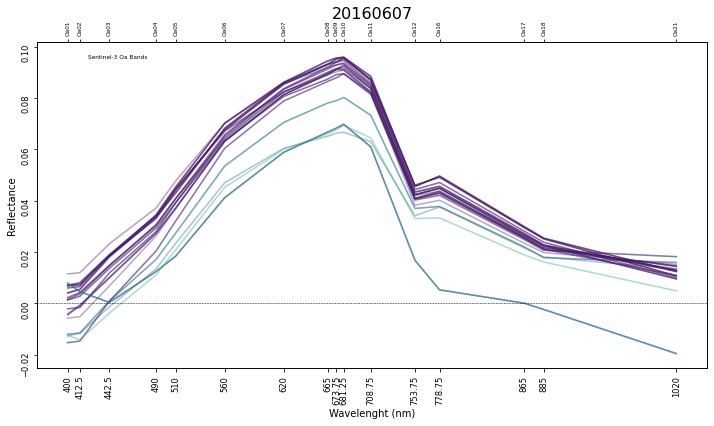

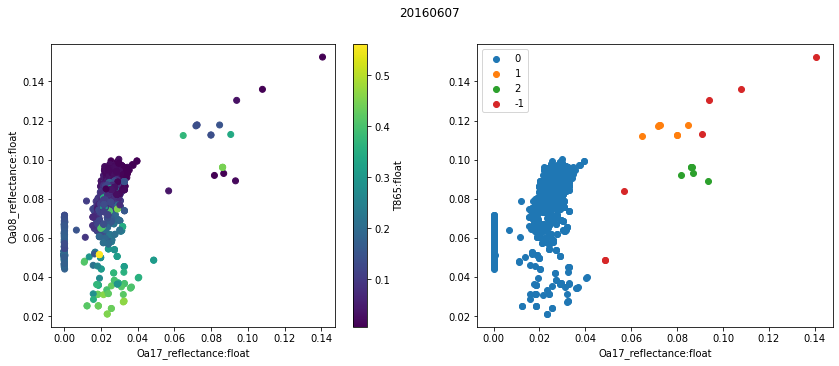

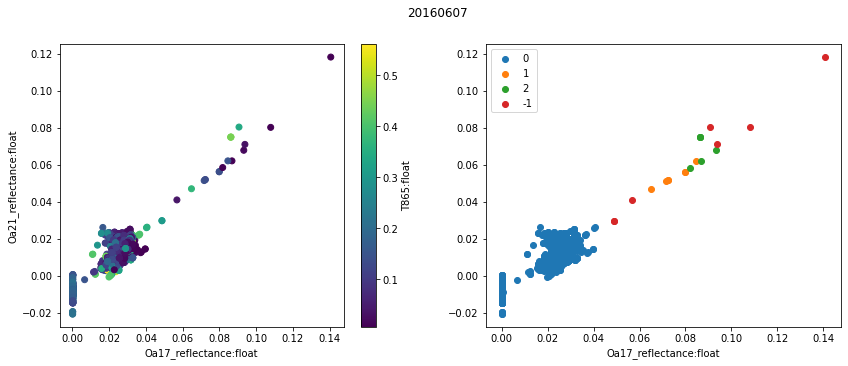

In [18]:
out_20160607 = just_open_radiometry(Path(r'/d_drive_data/processing/linux/14100000_manacapuru_v15/S3A_OL_2_WFR____20160607T132743_20160607T132943_20171101T053245_0119_005_081______MR1_R_NT_002.csv'))
# out_20161023 = just_open_radiometry(Path(r'D:/processing/linux/14100000_manacapuru_v15/S3A_OL_2_WFR____20161023T134933_20161023T135133_20171104T083102_0119_010_124______MR1_R_NT_002.csv'))
# out_20161123 = just_open_radiometry(Path(r'D:/processing/linux/14100000_manacapuru_v15/S3A_OL_2_WFR____20161123T134634_20161123T134834_20171105T005133_0119_011_181______MR1_R_NT_002.csv'))
# out_20171005 = just_open_radiometry(Path(r'D:/processing/linux/14100000_manacapuru_v15/S3A_OL_2_WFR____20171005T135312_20171005T135512_20171225T173904_0119_023_067______MR1_R_NT_002.csv'))
# out_20171124 = just_open_radiometry(Path(r'D:/processing/linux/14100000_manacapuru_v15/S3A_OL_2_WFR____20171124T135555_20171124T135755_20171227T031734_0119_025_010______MR1_R_NT_002.csv'))
# out_20181126 = just_open_radiometry(Path(r'D:/processing/linux/14100000_manacapuru_v15/S3A_OL_2_WFR____20181126T134229_20181126T134529_20181127T233605_0179_038_238_3060_MAR_O_NT_002.csv'))
out_20190130 = just_open_radiometry(Path(r'/d_drive_data/processing/linux/14100000_manacapuru_v15/S3A_OL_2_WFR____20190130T135728_20190130T140028_20190131T232542_0179_041_010_3060_MAR_O_NT_002.csv'))
out_20191031 = just_open_radiometry(Path(r'/d_drive_data/processing/linux/14100000_manacapuru_v15/S3A_OL_2_WFR____20191031T135347_20191031T135647_20191113T155040_0180_051_067_3060_MAR_O_NT_002.csv'))
# out_20191104 = just_open_radiometry(Path(r'D:/processing/linux/14100000_manacapuru_v15/S3A_OL_2_WFR____20191104T135002_20191104T135302_20191124T134508_0179_051_124_3060_MAR_O_NT_002.csv'))

b8, b17, b21 = ('Oa08_reflectance:float','Oa17_reflectance:float', 'Oa21_reflectance:float')

bands = ['Oa17_reflectance:float','Oa08_reflectance:float']

db_scan(out_20160607, bands, eps=0.01)
# db_scan(out_20161023, [b17, b21], eps=0.01)
# db_scan(out_20161123, [b17, b21], eps=0.01)
# db_scan(out_20171005, [b17, b21], eps=0.01)
# db_scan(out_20171124, [b17, b21], eps=0.01)
# db_scan(out_20181126, [b17, b21], eps=0.01)
db_scan(out_20190130, [b17, b21], eps=0.01)
db_scan(out_20191031, [b17, b21], eps=0.01)
# db_scan(out_20191104, [b17, b21], eps=0.01)

target = out_20160607
tname = '20160607\n'
s3l2_custom_reflectance_plot(df=target, figure_title=tname)
plot_scattercluster(target,col_x=b17, col_y=b8, title=tname)
plot_scattercluster(target,col_x=b17, col_y=b21, title=tname)

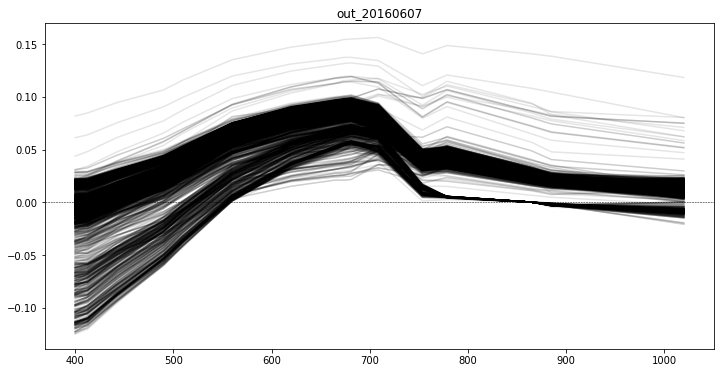

In [22]:
radiometry = out_20160607

pltdata = radiometry[radiometry.columns[11:27]]

plt.rcParams['figure.figsize'] = [12, 6]
plt.title(f'out_20160607')
for n, i in enumerate(pltdata.iterrows()):
    plt.plot(list(ncxp.s3_bands_l2.values()),i[1].values, alpha=0.1, c='k')
plt.axhline(y=0, xmin=0, xmax=1, linewidth=0.5, color='black', linestyle='--')
plt.show()
plt.close()

## SPM

In [13]:
manacapuru_sed_xls = Path('D:/processing/linux/14100000_manacapuru_v15_sedimentos.xlsx')
# sed_xls = '/d_drive_data/processing/linux/14100000_manacapuru_v15.xlsx'
df_manacapuru_sed = pd.read_excel(manacapuru_sed_xls,sheet_name='sedimentos')
# Fix excel dates from ordinal (40603) to datetime.datetime(2011, 3, 1, 0, 0)
df_manacapuru_sed['pydate'] = [from_excel_ordinal(d) for d in df_manacapuru_sed['Data']]
# Reorder the DF by datetime 
df_manacapuru_sed.sort_values(by='pydate', inplace=True)

In [13]:
borba_sed_xls = Path('/d_drive_data/processing/linux/15860000_borba_madeira_v15_sedimentos.xlsx')
# borba_sed_xls = Path('D:/processing/linux/15860000_borba_madeira_v15_sedimentos.xlsx')
# sed_xls = '/d_drive_data/processing/linux/14100000_manacapuru_v15.xlsx'
df_borba_sed = pd.read_excel(borba_sed_xls,sheet_name='sedimentos')
# Fix excel dates from ordinal (40603) to datetime.datetime(2011, 3, 1, 0, 0)
df_borba_sed['pydate'] = [from_excel_ordinal(d) for d in df_borba_sed['Data']]
# Reorder the DF by datetime 
df_borba_sed.sort_values(by='pydate', inplace=True)

In [ ]:
obidos_sed_xls = Path('D:/processing/linux/17050001_obidos_v15b_sedimentos.xlsx')
# sed_xls = '/d_drive_data/processing/linux/14100000_manacapuru_v15.xlsx'
df_obidos_sed = pd.read_excel(obidos_sed_xls,sheet_name='sedimentos')
# Fix excel dates from ordinal (40603) to datetime.datetime(2011, 3, 1, 0, 0)
df_obidos_sed['pydate'] = [from_excel_ordinal(d) for d in df_obidos_sed['Data']]
# Reorder the DF by datetime 
df_obidos_sed.sort_values(by='pydate', inplace=True)
# Fix outlier for Óbidos
df_obidos_sed.drop(df_obidos_sed.tail(1).index,inplace=True)

## CAMS 2016:2020

In [14]:
# camscsvfolder = Path('/d_drive_data/A1_JM/artigo_SEN3R/2_mat_met/CAMS')
camscsvfolder = Path('D:/A1_JM/artigo_SEN3R/2_mat_met/CAMS')

In [15]:
station2cams = [s for s in os.listdir(camscsvfolder) if s.endswith('.csv')]

In [16]:
cams_station_dict = {}
for s in station2cams:
    sname = s.split('.')[0]
    df = pd.read_csv(camscsvfolder/s)
    cams_station_dict[sname] = df

In [17]:
cams_station_dict.keys()

dict_keys(['an1', 'borba_madeira', 'coari', 'fonte_boa', 'itacoatiara', 'manacapuru', 'negro', 'obidos', 'tefe'])

## Testing band combinations for DBSCAN

In [18]:
import itertools
from sklearn.metrics import mean_squared_log_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error as mse
from scipy.stats import pearsonr
from scipy.stats import spearmanr

def rmse(predictions, targets):
    return np.sqrt(((predictions - targets) ** 2).mean())

def mape(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

def rmse_log(prediction, target):
    return np.sqrt(mean_squared_log_error(target, prediction))

def pbias(list_sim, list_obs):
    if (len(list_sim) != len(list_obs)):
        print("not the same length between observed and simulated")
        print("len(list_obs) = ",len(list_obs))
        print("len(list_sim) = ",len(list_sim))
        return None
    delta = 0.
    sum_obs = 0.
    for i in range(len(list_sim)):
        delta += list_sim[i] - list_obs[i]
        sum_obs += list_obs[i]
    return 100*delta / sum_obs

In [19]:
comb_bands = ['B4-490', 'B6-560', 'B8-665', 'B17-865', 'B21-1020', 'T865:float', 'A865:float']

In [20]:
combs = [list(c) for c in itertools.combinations(comb_bands, 3)]

In [21]:
len(combs)

35

In [22]:
sys.path.append('../../')
import utils as s3u

In [23]:
# manacapuru_vrtx = s3u.geojson_to_polygon('/d_drive_data/A1_JM/artigo_SEN3R/2_mat_met/study_area/geojson/14100000_manacapuru.geojson')
# borba_madeira_vrtx = s3u.geojson_to_polygon('/d_drive_data/A1_JM/artigo_SEN3R/2_mat_met/study_area/geojson/15860000_borba_madeira.geojson')
# obidos_vrtx = s3u.geojson_to_polygon('/d_drive_data/A1_JM/artigo_SEN3R/2_mat_met/study_area/geojson/17050001_obidos.geojson')

manacapuru_vrtx = s3u.geojson_to_polygon('D:/A1_JM/artigo_SEN3R/2_mat_met/study_area/geojson/14100000_manacapuru.geojson')
borba_madeira_vrtx = s3u.geojson_to_polygon('D:/A1_JM/artigo_SEN3R/2_mat_met/study_area/geojson/15860000_borba_madeira.geojson')
obidos_vrtx = s3u.geojson_to_polygon('D:/A1_JM/artigo_SEN3R/2_mat_met/study_area/geojson/17050001_obidos.geojson')

In [24]:
# borba_madeira_path = Path(r'D:\processing\linux\15860000_borba_madeira_v15')
# borba_madeira_path = Path('/d_drive_data/processing/linux/15860000_borba_madeira_v17aot/')

stations = {
    
    '14100000 Manacapuru': {'rad_path': Path(r'D:\processing\linux\14100000_manacapuru_v15'),
                            'cams_station_name': 'manacapuru',
                            'df_true_sed': df_manacapuru_sed},
    
#     '15860000 Borba/Madeira': {'rad_path': borba_madeira_path,
#                                'poly_path': borba_madeira_vrtx,
#                                'cams_station_name': 'borba_madeira',
#                                'df_true_sed': df_borba_sed},
    
#     '17050001 Óbidos': {'rad_path': Path(r'D:\processing\linux\17050001_obidos_v15b'),
#                         'cams_station_name': 'obidos',
#                         'df_true_sed': df_obidos_sed}
}

In [26]:
# Quick check of dictionary contents b4 the loop
for s_title, s_data in stations.items():
    print(s_title, ':', s_data['cams_station_name'], '\n', s_data['rad_path'])

15860000 Borba/Madeira : borba_madeira 
 /d_drive_data/processing/linux/15860000_borba_madeira_v17aot


In [51]:
final_stats = []
for s_title, s_data in stations.items():
    
    radiometries = load_radiometries(s_data['rad_path'])
    df_cams = cams_station_dict[s_data['cams_station_name']]
    df_cams['pydate'] = pd.to_datetime(df_cams['Datetime'])
    vrtx = s_data['poly_path']
    
    # set image saving folder
    path2save = Path('/d_drive_data/A1_JM/artigo_SEN3R/3_results/test_band_combinations') / Path(s_data['cams_station_name'])
    #path2save = Path(r'D:\A1_JM\artigo_SEN3R\3_results\test_band_combinations') / Path(s_data['cams_station_name'])
    path2save.mkdir(parents=True, exist_ok=True)
    
    # each iteration result will be a dict, later appended to the final_stats list
    
    for e, c in enumerate(combs):
        
        row_result = {}
        
        # Add entry
        row_result['station'] = s_data['cams_station_name']
        row_result['cluster_bands'] = c
        
        # Create time-series using the combination of bands in "c"
        dbs_station = create_time_series_cluster(radiometries, bands=c)

        # Replace the hour of S3 observations (normally between 10:00AM and 15:00PM) and replace them all with 12:00 to match with CAMS
        dbs_station['Date'] = [t.replace(hour=12) for t in dbs_station['Date']]

        # For every day in S3, find the equivalent observation day in CAMS
        matchCAMS = []  # matchCAMS is the list containing every CAMS observation that match S3 'Date' column
        for i, row in dbs_station.iterrows():
            match = df_cams[df_cams['pydate'] == row['Date']]
            matchCAMS.append(match.AOD865.values[0])

        # Add the matching CAMS days to the original S3 DF
        dbs_station['CAMS'] = matchCAMS

        # CAMS observations tend to be always bellow that of S3 AOT 865
        # We treat observations that does not follow this rule as outliers
        dbs_station_filter = dbs_station[dbs_station['T865:float'] > dbs_station['CAMS']].copy()

        # Get the model-based SPM
        dbs_station_filter['SPM:AMZMOD'] = SPM_GETAMZmod(band865=dbs_station_filter['B17-865'], band665=dbs_station_filter['B8-665'])
        
        # Get the SPM y-true ground-truth
        y_true_sed = s_data['df_true_sed'].copy()
        # Create a datetime column
        y_true_sed.index = [t.replace(hour=12) for t in y_true_sed['pydate']]
        y_true_sed.index.rename('Date')
        # Sort by ascending from 2016 to present
        y_true_sed.sort_index(inplace=True, ascending=True)
        # Slice by date using the DBSCAN DF as a limit
        y_true_sed = y_true_sed.loc[dbs_station['Date'].min():dbs_station['Date'].max()]
        
        #####################################################################
        # PLOT S3 B17 FOR A GIVEN CLUSTERING WITH AND WITHOUT THE CAMS DROP #
        #####################################################################
        b17_plot_title = f"{s_title}: Mean IR before/after CAMS for DBSCAN Combination = {c}"
        plt.figure(figsize=(16,8))
        plt.title(b17_plot_title)
        plt.plot(dbs_station['Date'],dbs_station['B17-865'],label='S3:B17:865nm')
        plt.plot(dbs_station_filter['Date'],dbs_station_filter['B17-865'],label='S3:B17:865nm C.Drop')
        plt.legend()
        plt.savefig(path2save/f'compare_b17_c{e}.png', bbox_inches='tight')
        plt.close()
        #plt.show()
        
        #####################################
        # PLOT SPM COMPARISON FOR HYB vs S3 #
        #####################################
        plt.figure(figsize=(16,8))
        plt.title(f'{s_title}: S3 vs ground SPM concentrations. {c}')
        plt.plot(y_true_sed['Concentração (mg/L)'], label='HYB:SPM')
        plt.plot(dbs_station_filter['Date'],dbs_station_filter['SPM:AMZMOD'], label='S3:SPM')
        plt.legend()
        plt.savefig(path2save/f'compare_spm_c{e}.png', bbox_inches='tight')
        plt.close()
        #plt.show()
        
        ################################################
        # STATISTICAL TESTS USING INTERPOLATED PAIRING #
        ################################################
        # copy only the SPM column to a new pd.series
        s3spm = dbs_station_filter['SPM:AMZMOD']
        # set the series index to datetime
        s3spm.index = dbs_station_filter['Date']
        # create a range of daily events to be used as indexer
        idx = pd.date_range(start=dbs_station_filter['Date'].min(),end=dbs_station_filter['Date'].max(),freq='D')
        # use the range as an index for a new pandas series
        daily_s3_spm = pd.Series(np.nan, index=idx)
        # spread the satelite measures over its respective days using the previously created indexer
        daily_s3_spm[s3spm.index] = s3spm
        # fill the NaNs by linear interpolation
        daily_s3_spm.interpolate(method='time', inplace=True)
        # create S3:SPM series containing the matching HYBAM:SPM
        y_pred_itr = daily_s3_spm[y_true_sed.index]
        y_true_itr = y_true_sed['Concentração (mg/L)']
        # drop NaNs
        ytp_iter = pd.DataFrame({'y_true':y_true_itr, 'y_pred':y_pred_itr})
        ytp_iter.dropna(inplace=True)
        y_true_itr = ytp_iter['y_true'].copy()
        y_pred_itr = ytp_iter['y_pred'].copy()
        del ytp_iter
        
        # save results to dict
        row_result['itr_pcorr'], _ = pearsonr(y_true_itr, y_pred_itr)
        row_result['itr_scorr'], _ = spearmanr(y_true_itr, y_pred_itr)
        row_result['itr_rmse_log'] = rmse_log(y_pred_itr, y_true_itr)
        row_result['itr_rmse'] = rmse(y_pred_itr, y_true_itr)
        row_result['itr_mape'] = mape(y_true_itr, y_pred_itr)
        row_result['itr_pbias'] = pbias(y_pred_itr, y_true_itr)
        row_result['itr_r2'] = r2_score(y_true_itr, y_pred_itr)
        
        # generate scatter texts
        txt_itr_pcorr = str(round(row_result['itr_pcorr'],3))
        txt_itr_scorr = str(round(row_result['itr_scorr'],3))
        txt_itr_rmselog = str(round(row_result['itr_rmse_log'],2))
        txt_itr_rmse = str(round(row_result['itr_rmse'],2))
        txt_itr_mape = str(round(row_result['itr_mape'],2))
        txt_itr_bias = str(round(row_result['itr_pbias'],3))
        txt_itr_r2 = str(round(row_result['itr_r2'],3))

        itr_stats_txt = f'p.corr = {txt_itr_pcorr}\ns.corr = {txt_itr_scorr}\nRMSElog = {txt_itr_rmselog}\nRMSE = {txt_itr_rmse}\nMAPE = {txt_itr_mape}\n% BIAS = {txt_itr_bias}\nR2 = {txt_itr_r2}'
        
        ##########################################
        # STATISTICAL TESTS USING SIMPLE PAIRING #
        ##########################################
        # Drop the index and save it as a column
        y_true_sed.reset_index(inplace=True)
        # Rename the dropped index -> Date
        y_true_sed.rename(columns={'index':'Date'}, inplace=True)
        # merge can't be done if y_true_sed has a 'Date' column equal to its index, hence the drop
        dfmerged = y_true_sed.merge(dbs_station_filter, on='Date')
        row_result['simple_pair_n'] = len(dfmerged)
        y_true=dfmerged['Concentração (mg/L)']
        y_pred=dfmerged['SPM:AMZMOD']
        # drop NaNs
        ytp_sp = pd.DataFrame({'y_true':y_true, 'y_pred':y_pred})
        ytp_sp.dropna(inplace=True)
        y_true = ytp_sp['y_true'].copy()
        y_pred = ytp_sp['y_pred'].copy()
        del ytp_sp
        
        # save results to dict
        row_result['sp_pcorr'], _ = pearsonr(y_true, y_pred)
        row_result['sp_scorr'], _ = spearmanr(y_true, y_pred)
        row_result['sp_rmse_log'] = rmse_log(y_pred, y_true)
        row_result['sp_rmse'] = rmse(y_pred, y_true)
        row_result['sp_mape'] = mape(y_true, y_pred)
        row_result['sp_pbias'] = pbias(y_pred, y_true)
        row_result['sp_r2'] = r2_score(y_true, y_pred)
        
        # generate annotation texts
        txt_pcorr = str(round(row_result['sp_pcorr'],3))
        txt_scorr = str(round(row_result['sp_scorr'],3))
        txt_rmselog = str(round(row_result['sp_rmse_log'],2))
        txt_rmse = str(round(row_result['sp_rmse'],2))
        txt_mape = str(round(row_result['sp_mape'],2))
        txt_bias = str(round(row_result['sp_pbias'],3))
        txt_r2 = str(round(row_result['sp_r2'],3))

        stats_txt = f'p.corr = {txt_pcorr}\ns.corr = {txt_scorr}\nRMSElog = {txt_rmselog}\nRMSE = {txt_rmse}\nMAPE = {txt_mape}\n% BIAS = {txt_bias}\nR2 = {txt_r2}'
        
        ###########################################
        # PLOT SIMPLE PAIRS WITHOUT INTERPOLATION #
        ###########################################
        plt.figure(figsize=(16,8))
        plt.title(f'{s_title}: True matching dates ({len(dfmerged)}) S3 vs HYB SPM concentrations. {c}')
        plt.plot(dfmerged['Date'],dfmerged['Concentração (mg/L)'], label='HYB:SPM')
        plt.plot(dfmerged['Date'],dfmerged['SPM:AMZMOD'], label='S3:SPM')
        plt.annotate(text=stats_txt, xycoords='axes fraction', xy=(0.9,0.03))
        plt.legend()
        plt.savefig(path2save/f'simple_pair_spm_c{e}.png', bbox_inches='tight')
        plt.close()
        #plt.show()
        
        #################
        # PLOT SCATTERS #
        #################
        plt.rcParams['figure.figsize'] = [12, 5.6]
        fig, (ax1, ax2) = plt.subplots(1, 2)

        fig.suptitle(f'SPM HYBAM vs Sentinel-3 for {c}')

        ax1.scatter(y_true_itr, y_pred_itr, s=3)
        ax2.scatter(y_true, y_pred, s=3)

        ax1.plot([0, 200], [0, 200], 'k-', linewidth=1)
        ax1.plot([0, 0], [-0.02, 0.2], c='grey', linestyle='dashed', linewidth=1)
        ax1.plot([-0.02, 0.2], [0, 0], c='grey', linestyle='dashed', linewidth=1)
        ax1.annotate(text=itr_stats_txt, xycoords='axes fraction', xy=(0.7,0.03))

        ax2.plot([0, 200], [0, 200], 'k-', linewidth=1)
        ax2.plot([0, 0], [-0.02, 0.2], c='grey', linestyle='dashed', linewidth=1)
        ax2.plot([-0.02, 0.2], [0, 0], c='grey', linestyle='dashed', linewidth=1)
        ax2.annotate(text=stats_txt, xycoords='axes fraction', xy=(0.7,0.03))

        ax1.set_ylabel('(y-true) SPM:HYBAM ')

        ax1.set_xlabel('(y-pred) SPM:S3 Interpolated')
        ax2.set_xlabel('(y-pred) SPM:S3 Simple pairs')
        
        plt.savefig(path2save/f'scatter_spm_c{e}.png', bbox_inches='tight')
        plt.close()        
        
        ##############################
        # DONE: Save results to dict #
        ##############################
        print(f'Completed {s_data["cams_station_name"]} : RMSE_log (itr={round(row_result["itr_rmse_log"],2)} sp={txt_rmselog}) : {c}')
        final_stats.append(row_result)
    

Completed borba_madeira : RMSE_log (itr=0.91 sp=1.17) : ['B4-490', 'B6-560', 'B8-665']
Completed borba_madeira : RMSE_log (itr=0.85 sp=1.04) : ['B4-490', 'B6-560', 'B17-865']
Completed borba_madeira : RMSE_log (itr=0.84 sp=1.04) : ['B4-490', 'B6-560', 'B21-1020']
Completed borba_madeira : RMSE_log (itr=0.78 sp=1.03) : ['B4-490', 'B6-560', 'T865:float']
Completed borba_madeira : RMSE_log (itr=0.82 sp=1.29) : ['B4-490', 'B6-560', 'A865:float']
Completed borba_madeira : RMSE_log (itr=0.84 sp=1.1) : ['B4-490', 'B8-665', 'B17-865']
Completed borba_madeira : RMSE_log (itr=0.84 sp=1.09) : ['B4-490', 'B8-665', 'B21-1020']
Completed borba_madeira : RMSE_log (itr=0.77 sp=1.05) : ['B4-490', 'B8-665', 'T865:float']
Completed borba_madeira : RMSE_log (itr=0.79 sp=1.17) : ['B4-490', 'B8-665', 'A865:float']
Completed borba_madeira : RMSE_log (itr=0.85 sp=1.04) : ['B4-490', 'B17-865', 'B21-1020']
Completed borba_madeira : RMSE_log (itr=0.76 sp=0.99) : ['B4-490', 'B17-865', 'T865:float']
Completed borb

In [52]:
savepath = Path('/d_drive_data/A1_JM/artigo_SEN3R/3_results/test_band_combinations/band_3_v17_comb_stats.csv')
# savepath = Path(r'D:\A1_JM\artigo_SEN3R\3_results\test_band_combinations\band_4_comb_stats.csv')
df_stats = pd.DataFrame(final_stats)
df_stats.to_csv(savepath, index=False)

## GENERATE SPM MAPS

In [74]:
radiometries = load_radiometries(Path('/d_drive_data/processing/linux/17050001_obidos_v17aot/'))

In [75]:
vrtx = obidos_vrtx

In [76]:
path2save = Path('/d_drive_data/A1_JM/artigo_SEN3R/3_results/test_band_combinations') / 'obidos_spmap'
#path2save = Path(r'D:\A1_JM\artigo_SEN3R\3_results\test_band_combinations') / Path(s_data['cams_station_name'])
path2save.mkdir(parents=True, exist_ok=True)

In [77]:
for date, radiometry in radiometries.items():

    if len(radiometry) < 5:
        continue 

    plot_spm_map(df=radiometry,
                 spm_vertex=vrtx,
                 title=date,
                 path2save=path2save/f'{date}_spmap.png')

    #db_scan(radiometry, bands, eps=eps, min_samples=min_samples)
    #clusters = radiometry.groupby(by='cluster').mean()

    # drop the noise
    #clusters.drop(-1, inplace=True, errors='ignore')

    # if there is at least 1 valid cluster
    #if len(clusters) > 0:
    #    df = df.append(clusters[clusters['B21-1020'] == clusters['B21-1020'].min()].iloc[0].rename(date))

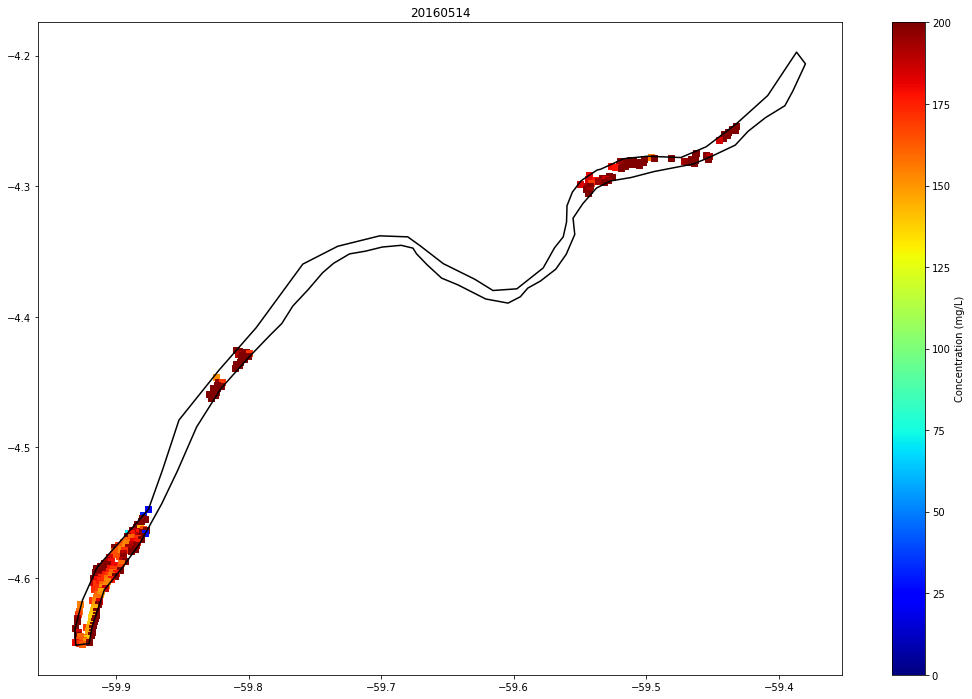

In [47]:
plot_spm_map(df=radiometries['20160514'],
             spm_vertex=borba_madeira_vrtx,
             title='20160514')

In [24]:
sys.path.append('../../')
import utils as s3u

In [25]:
vertx = s3u.geojson_to_polygon('/d_drive_data/A1_JM/artigo_SEN3R/2_mat_met/study_area/geojson/15860000_borba_madeira.geojson')

In [ ]:
radiometries

In [27]:
# radiometries = load_radiometries(Path(r'/d_drive_data/processing/linux/14100000_manacapuru_v-fin/'))
# radiometries = load_radiometries(Path(r'/d_drive_data/processing/linux/14100000_manacapuru_vv-cams'))
radiometries = load_radiometries(Path('D:/processing/linux/14100000_manacapuru_vv-cams'))

In [ ]:
# 20190426
'S3A_OL_2_WFR____20180525T133838_20180525T134138_20180526T203409_0179_031_295_3060_MAR_O_NT_002.csv'
'S3B_OL_2_WFR____20190517T134411_20190517T134711_20190518T190927_0180_025_238_3060_MAR_O_NT_002.csv'

# 20180614~
'S3A_OL_2_WFR____20180613T134607_20180613T134907_20180614T195137_0180_032_181_3060_MAR_O_NT_002.csv'

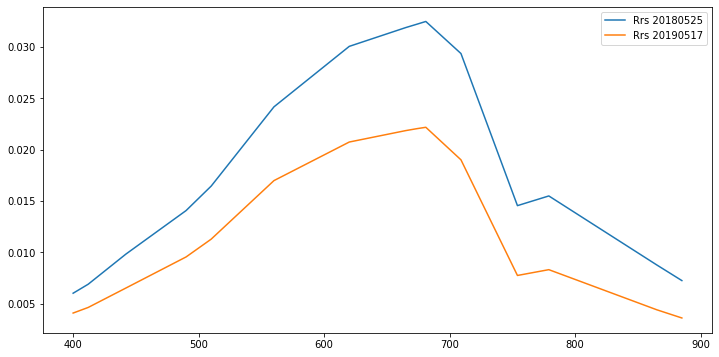

In [38]:
# rrs20171205 = {
#     400: 0.01305668,
#     412: 0.01441154,
#     442: 0.01870881,
#     490: 0.02421438,
#     510: 0.02729556,
#     560: 0.03722843,
#     620: 0.04477865,
#     665: 0.04660349,
#     674: 0.04691227,
#     681: 0.04720282,
#     709: 0.04465297,
#     754: 0.02792284, 
#     779: 0.02939233,
#     865: 0.01914839,
#     885: 0.01643757,
#     }

rrs20180525 = {
    400: 0.006022169,
    412: 0.006897184,
    442: 0.009825045,
    490: 0.014063636,
    510: 0.016445276,
    560: 0.024153048,
    620: 0.030036916,
    665: 0.031865187,
    674: 0.032197132,
    681: 0.032459760,
    709: 0.029339340,
    754: 0.014542549,
    779: 0.015485147,
    865: 0.008773744,
    885: 0.007251159,    
}

rrs20190517 = {
    400: 0.004092663,
    412: 0.004637945,
    442: 0.006524111,
    490: 0.009552016,
    510: 0.011283676,
    560: 0.016977391,
    620: 0.020730395,
    665: 0.021842411,
    674: 0.022032663,
    681: 0.022164155,
    709: 0.018998221,
    754: 0.007749402,
    779: 0.008313424,
    865: 0.004411801,
    885: 0.003613439,
}

# 'B1',
# 'B2-412.5',
# 'B3-442.5',
# 'B4-490',
# 'B5-510',
# 'B6-560',
# 'B7-620',
# 'B8-665',
# 'B9-673.75',
# 'B10-681.25',
# 'B11-708.75',
# 'B12-753.75',
# 'B16-778.75',
# 'B17-865',
# 'B18-885'

# plt.plot(rrs20171205.keys(),rrs20171205.values())
plt.plot(rrs20180525.keys(),rrs20180525.values(), label='Rrs 20180525')
plt.plot(rrs20190517.keys(),rrs20190517.values(), label='Rrs 20190517')
plt.legend()

In [42]:
vld_andre_spm = {
    '20160228': 181.99,
    '20160228': 236.76,
    '20160228': 310.31,
    '20160228': 425.33,
    '20160228': 198.97,
    '20170206': 216.14,
    '20170206': 258.87,
    '20170206': 151.97,
    '20170410': 76.60,
    '20170410': 104.40,
    '20170410': 48.20,
    '20171006': 77.89,
    '20171006': 102.13,
    '20171006': 86.14,
    '20180203': 178.80,
    '20180203': 319.23,
    '20180203': 216.56,
    '20180316': 149.20,
    '20180316': 198.00,
    '20180316': 178.80,
    '20180316': 100.60,
    '20180426': 147.20,
    '20180426': 189.60,
    '20180426': 169.20,
    '20180426': 102.40,
    '20180525': 103.00,
    '20180525': 119.40,
    '20180525': 66.00,
    '20180525': 66.80,
    '20180614': 76.00,
    '20180614': 70.80,
    '20180614': 114.60,
    '20180614': 60.20,
    '20180722': 8.20,
    '20180722': 7.20,
    '20180722': 71.60,
    '20180722': 42.40,
    '20180904': 40.80,
    '20180904': 64.60,
    '20180904': 85.00,
    '20180904': 40.20,
    '20190214': 121.40,
    '20190214': 172.80,
    '20190214': 215.80,
    '20190214': 133.80,
    '20190312': 98.00,
    '20190312': 174.20,
    '20190312': 119.80,
    '20190312': 71.80,
    '20190421': 50.60,
    '20190421': 23.00,
    '20190421': 49.60,
    '20190421': 19.80,
    '20190517': 27.60,
    '20190517': 59.60,
    '20190517': 54.80,
    '20190517': 30.60,
    '20190621': 28.60,
    '20190621': 40.60,
    '20190621': 35.80,
    '20190621': 18.80,
    '20190718': 34.60,
    '20190718': 46.00
}

In [45]:
print(set(list(radiometries.keys())) & set(vld_andre_rrs))

{'20190517'}


In [39]:
comb_bands = ['B4-490', 'B6-560', 'B8-665', 'B17-865', 'B21-1020', 'T865:float', 'A865:float']
combs = [list(c) for c in itertools.combinations(comb_bands, 3)]
print(len(combs))
combs

35


[['B4-490', 'B6-560', 'B8-665'],
 ['B4-490', 'B6-560', 'B17-865'],
 ['B4-490', 'B6-560', 'B21-1020'],
 ['B4-490', 'B6-560', 'T865:float'],
 ['B4-490', 'B6-560', 'A865:float'],
 ['B4-490', 'B8-665', 'B17-865'],
 ['B4-490', 'B8-665', 'B21-1020'],
 ['B4-490', 'B8-665', 'T865:float'],
 ['B4-490', 'B8-665', 'A865:float'],
 ['B4-490', 'B17-865', 'B21-1020'],
 ['B4-490', 'B17-865', 'T865:float'],
 ['B4-490', 'B17-865', 'A865:float'],
 ['B4-490', 'B21-1020', 'T865:float'],
 ['B4-490', 'B21-1020', 'A865:float'],
 ['B4-490', 'T865:float', 'A865:float'],
 ['B6-560', 'B8-665', 'B17-865'],
 ['B6-560', 'B8-665', 'B21-1020'],
 ['B6-560', 'B8-665', 'T865:float'],
 ['B6-560', 'B8-665', 'A865:float'],
 ['B6-560', 'B17-865', 'B21-1020'],
 ['B6-560', 'B17-865', 'T865:float'],
 ['B6-560', 'B17-865', 'A865:float'],
 ['B6-560', 'B21-1020', 'T865:float'],
 ['B6-560', 'B21-1020', 'A865:float'],
 ['B6-560', 'T865:float', 'A865:float'],
 ['B8-665', 'B17-865', 'B21-1020'],
 ['B8-665', 'B17-865', 'T865:float'],
 [

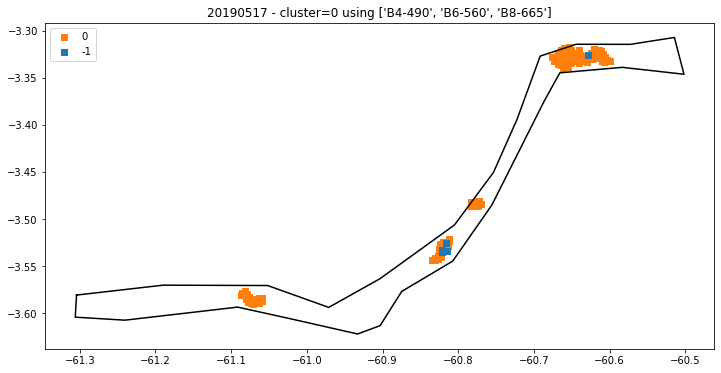

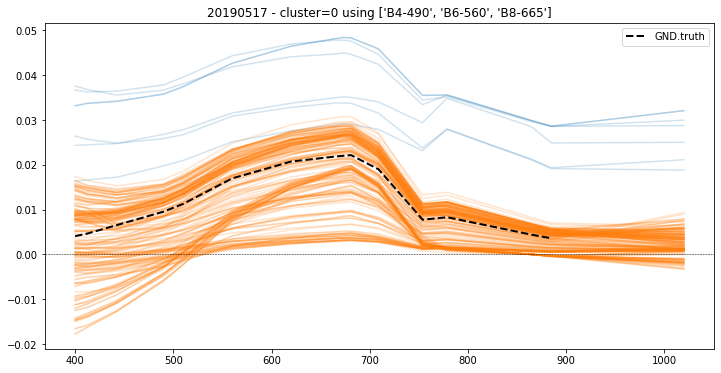

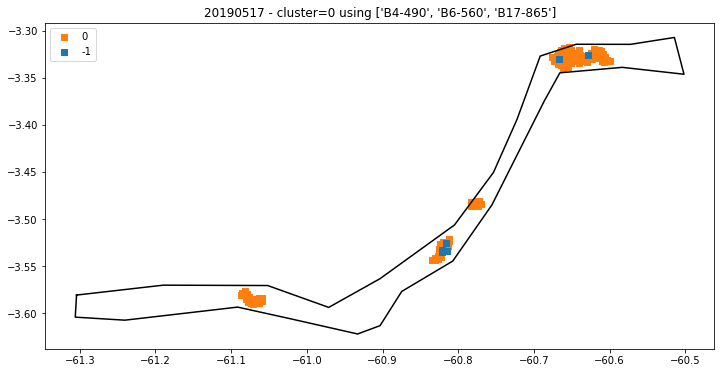

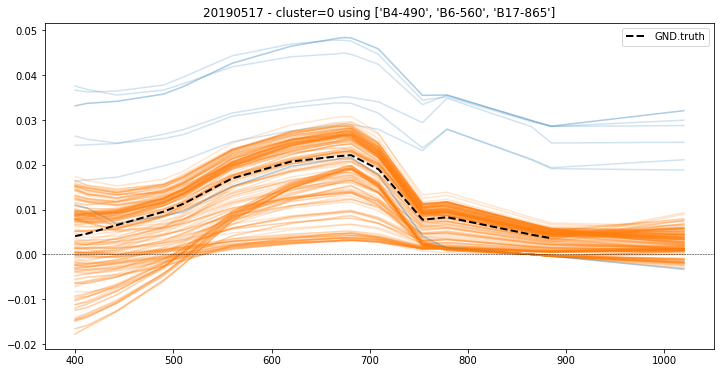

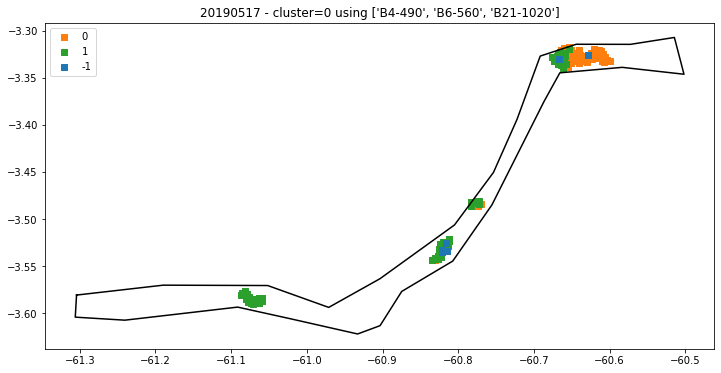

...

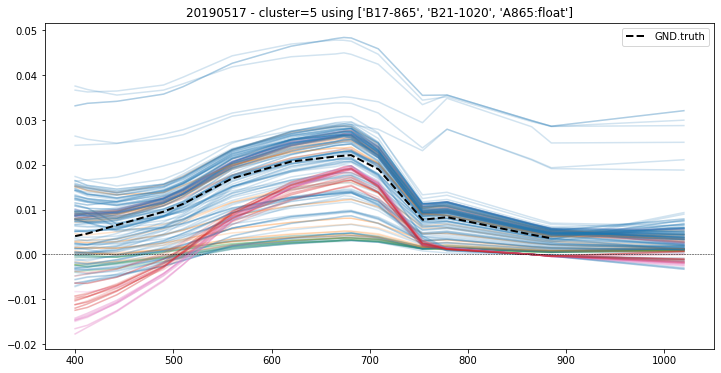

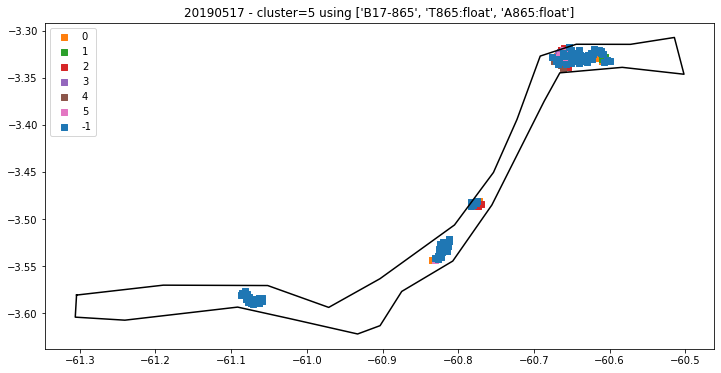

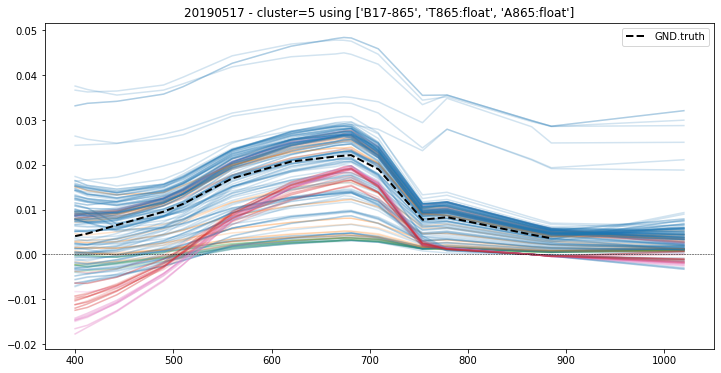

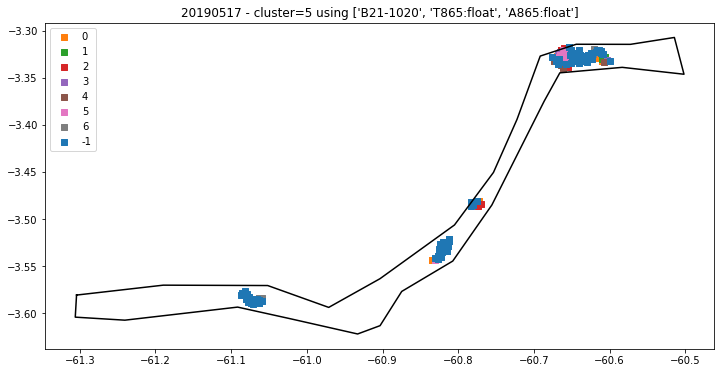

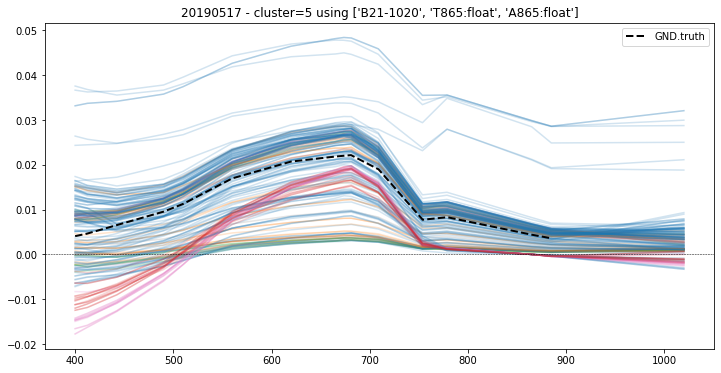

In [35]:
# vertx = borba_madeira_vrtx
vertx = manacapuru_vrtx

plt.rcParams['figure.figsize'] = [12, 6]

s3_bands_l2 = {
        'Oa01': 400,
        'Oa02': 412.5,
        'Oa03': 442.5,
        'Oa04': 490,
        'Oa05': 510,
        'Oa06': 560,
        'Oa07': 620,
        'Oa08': 665,
        'Oa09': 673.75,
        'Oa10': 681.25,
        'Oa11': 708.75,
        'Oa12': 753.75,
        'Oa16': 778.75,
        'Oa17': 865,
        'Oa18': 885,
        'Oa21': 1020
    }

colors = {-1:'C0', 0:'C1', 1:'C2', 2:'C3', 3:'C4', 4:'C5', 5:'C6', 6:'C7', 7:'C8', 8:'C9', 9:'k', 10:'k',
          11:'k', 12:'k', 13:'k', 14:'k', 15:'k', 16:'k', 17:'k', 18:'k', 19:'k', 20:'k'}

# key = list(radiometries.keys())[0]
key = '20190517'

for n, c in enumerate(combs):
    radiometry = radiometries[key]

    #bands = ['B6-560', 'B21-1020', 'T865:float', 'A865:float']
    bands = c
    eps = 0.01
    min_samples = 5
    save_folder = None

#     radiometry = normalize(radiometry, s3bands, 'B21-1020')
    
    db_scan(radiometry, bands, eps=eps, min_samples=min_samples)
    
    clusters = radiometry.groupby(by='cluster').mean()
    # drop the noise
    # clusters.drop(-1, inplace=True, errors='ignore')
    # if there is at least 1 valid cluster
    if len(clusters) > 0:
        k = clusters[clusters['B21-1020'] == clusters['B21-1020'].min()].index[0]
    
    for vert in vertx:
        plt.title(f'{key} - cluster={k} using {c}')
        plt.plot(vert[:,0],vert[:,1],c='k')

        # Get unique names of clusters
        uniq = list(set(radiometry['cluster']))

        # iterate to plot each cluster
        for i in range(len(uniq)):
            indx = radiometry['cluster'] == uniq[i]
            plt.scatter(radiometry['longitude:double'][indx], radiometry['latitude:double'][indx], 
                        marker='s', c=colors[uniq[i]], label=uniq[i])

    plt.legend()
#     plt.savefig(path2save/'kmap'/f'{key}_{n}.png', bbox_inches='tight')
    plt.show()
    
    pltdata = radiometry[radiometry.columns[11:27]]
    plt.title(f'{key} - cluster={k} using {c}')
    for n, i in enumerate(pltdata.iterrows()):
#         plt.plot(list(s3_bands_l2.values()),i[1].values,c=colors[radiometry['cluster'].loc[n]])
        plt.plot(list(s3_bands_l2.values()),i[1].values/np.pi,
                 c=colors[radiometry['cluster'].loc[n]], alpha=0.2)
    plt.axhline(y=0, xmin=0, xmax=1, linewidth=0.5, color='black', linestyle='--')
    plt.plot(rrs20190517.keys(),rrs20190517.values(),linewidth=2,c='k',linestyle='--',label='GND.truth')
    plt.legend()
    plt.show()
#     plt.savefig(path2save/f'{key}_{n}_s3rrs.png', bbox_inches='tight')
#     plt.close()

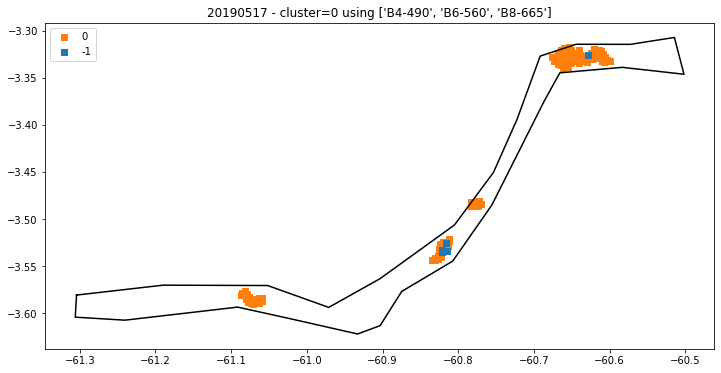

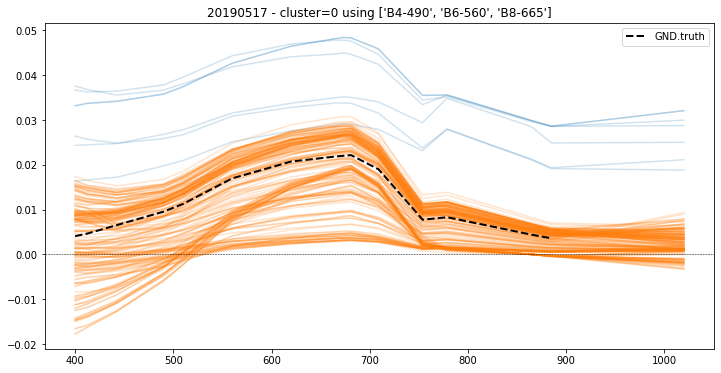

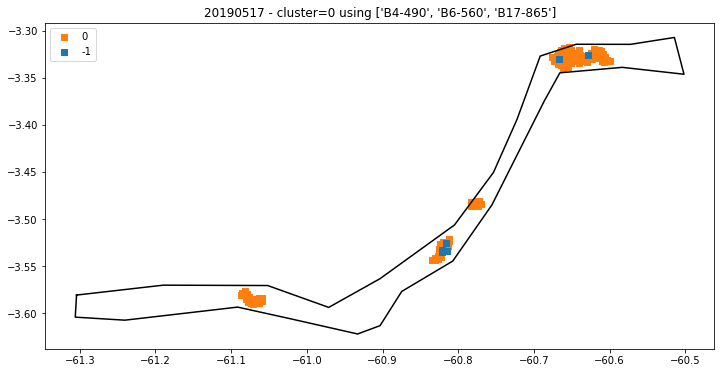

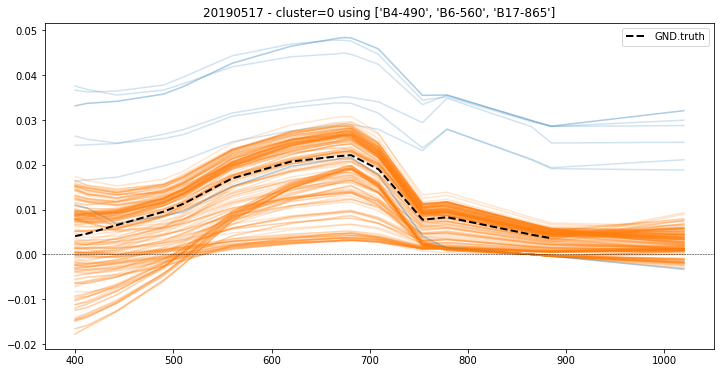

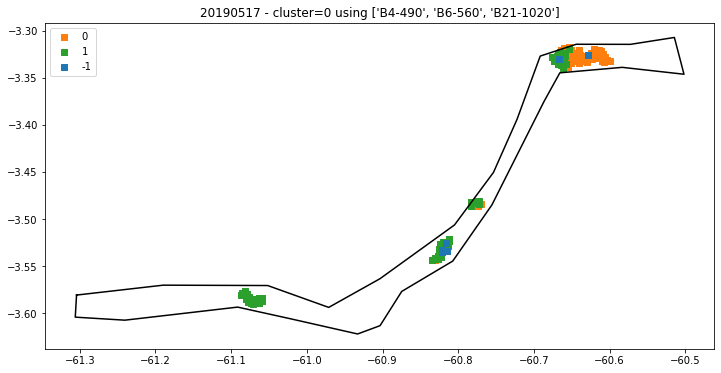

...

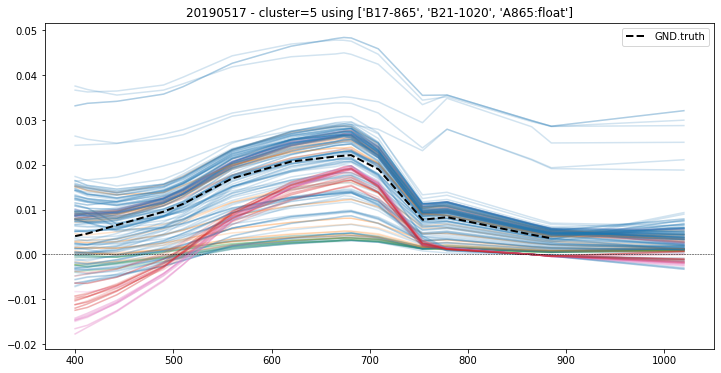

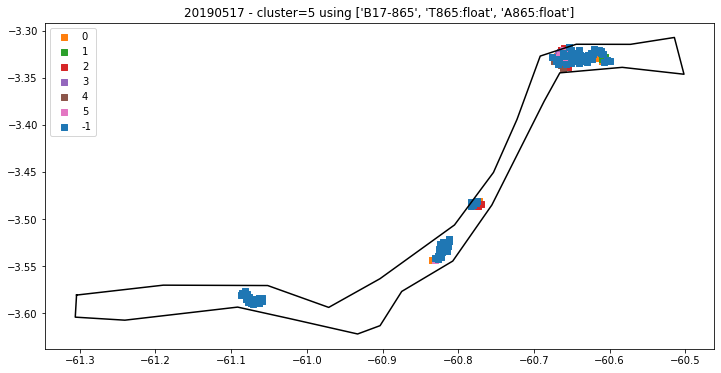

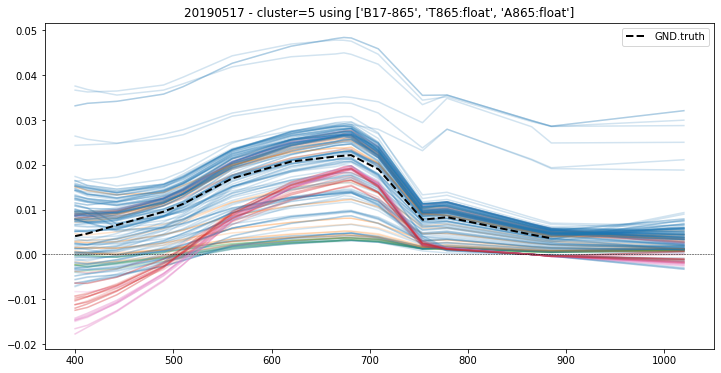

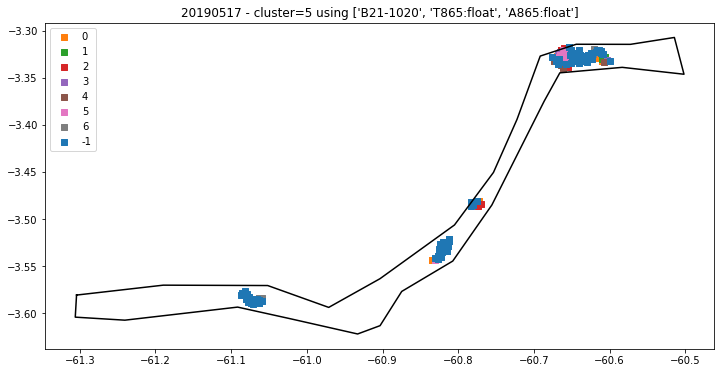

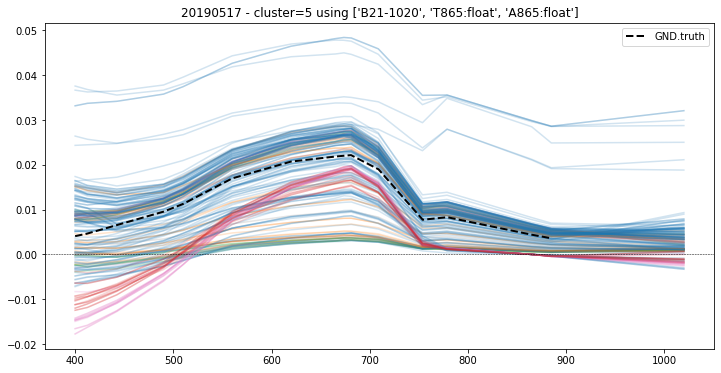

In [35]:
# vertx = borba_madeira_vrtx
vertx = manacapuru_vrtx

plt.rcParams['figure.figsize'] = [12, 6]

s3_bands_l2 = {
        'Oa01': 400,
        'Oa02': 412.5,
        'Oa03': 442.5,
        'Oa04': 490,
        'Oa05': 510,
        'Oa06': 560,
        'Oa07': 620,
        'Oa08': 665,
        'Oa09': 673.75,
        'Oa10': 681.25,
        'Oa11': 708.75,
        'Oa12': 753.75,
        'Oa16': 778.75,
        'Oa17': 865,
        'Oa18': 885,
        'Oa21': 1020
    }

colors = {-1:'C0', 0:'C1', 1:'C2', 2:'C3', 3:'C4', 4:'C5', 5:'C6', 6:'C7', 7:'C8', 8:'C9', 9:'k', 10:'k',
          11:'k', 12:'k', 13:'k', 14:'k', 15:'k', 16:'k', 17:'k', 18:'k', 19:'k', 20:'k'}

# key = list(radiometries.keys())[0]
key = '20190517'

for n, c in enumerate(combs):
    radiometry = radiometries[key]

    #bands = ['B6-560', 'B21-1020', 'T865:float', 'A865:float']
    bands = c
    eps = 0.01
    min_samples = 5
    save_folder = None

#     radiometry = normalize(radiometry, s3bands, 'B21-1020')
    
    db_scan(radiometry, bands, eps=eps, min_samples=min_samples)
    
    clusters = radiometry.groupby(by='cluster').mean()
    # drop the noise
    # clusters.drop(-1, inplace=True, errors='ignore')
    # if there is at least 1 valid cluster
    if len(clusters) > 0:
        k = clusters[clusters['B21-1020'] == clusters['B21-1020'].min()].index[0]
    
    for vert in vertx:
        plt.title(f'{key} - cluster={k} using {c}')
        plt.plot(vert[:,0],vert[:,1],c='k')

        # Get unique names of clusters
        uniq = list(set(radiometry['cluster']))

        # iterate to plot each cluster
        for i in range(len(uniq)):
            indx = radiometry['cluster'] == uniq[i]
            plt.scatter(radiometry['longitude:double'][indx], radiometry['latitude:double'][indx], 
                        marker='s', c=colors[uniq[i]], label=uniq[i])

    plt.legend()
#     plt.savefig(path2save/'kmap'/f'{key}_{n}.png', bbox_inches='tight')
    plt.show()
    
    pltdata = radiometry[radiometry.columns[11:27]]
    plt.title(f'{key} - cluster={k} using {c}')
    for n, i in enumerate(pltdata.iterrows()):
#         plt.plot(list(s3_bands_l2.values()),i[1].values,c=colors[radiometry['cluster'].loc[n]])
        plt.plot(list(s3_bands_l2.values()),i[1].values/np.pi,
                 c=colors[radiometry['cluster'].loc[n]], alpha=0.2)
    plt.axhline(y=0, xmin=0, xmax=1, linewidth=0.5, color='black', linestyle='--')
    plt.plot(rrs20190517.keys(),rrs20190517.values(),linewidth=2,c='k',linestyle='--',label='GND.truth')
    plt.legend()
    plt.show()
#     plt.savefig(path2save/f'{key}_{n}_s3rrs.png', bbox_inches='tight')
#     plt.close()

In [59]:
date = '20160518'
radiometry = radiometries[date]

In [60]:
len(radiometry)

939

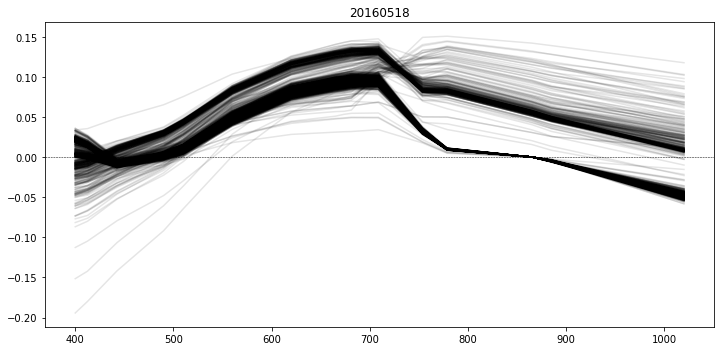

In [61]:
pltdata = radiometry[radiometry.columns[11:27]]
plt.title(f'{date}')
for n, i in enumerate(pltdata.iterrows()):
    plt.plot(list(ncxp.s3_bands_l2.values()),i[1].values, alpha=0.1, c='k')
plt.axhline(y=0, xmin=0, xmax=1, linewidth=0.5, color='black', linestyle='--')
plt.show()
plt.close()

In [47]:
radiometry = normalize(radiometry, s3bands, 'B21-1020')

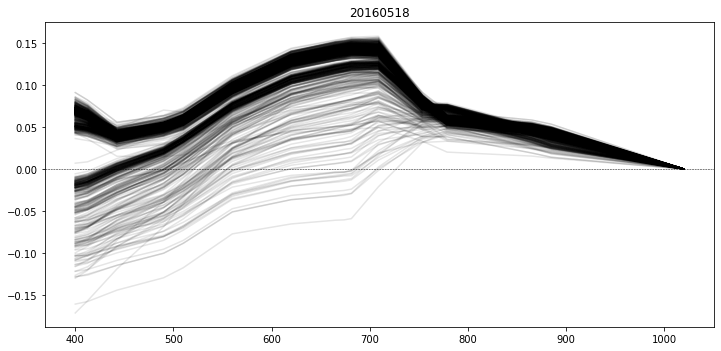

In [48]:
pltdata = radiometry[radiometry.columns[11:27]]
plt.title(f'{date}')
for n, i in enumerate(pltdata.iterrows()):
    plt.plot(list(ncxp.s3_bands_l2.values()),i[1].values, alpha=0.1, c='k')
plt.axhline(y=0, xmin=0, xmax=1, linewidth=0.5, color='black', linestyle='--')
plt.show()
plt.close()

In [62]:
valid_mndwi = (radiometry['MNDWI'] > -0.99) & (radiometry['MNDWI'] < 0.99)
valid_ndwi = (radiometry['NDWI'] > -0.99) & (radiometry['NDWI'] < 0.99)

In [63]:
radiometry = radiometry[valid_mndwi & valid_ndwi]

In [64]:
len(radiometry)

280

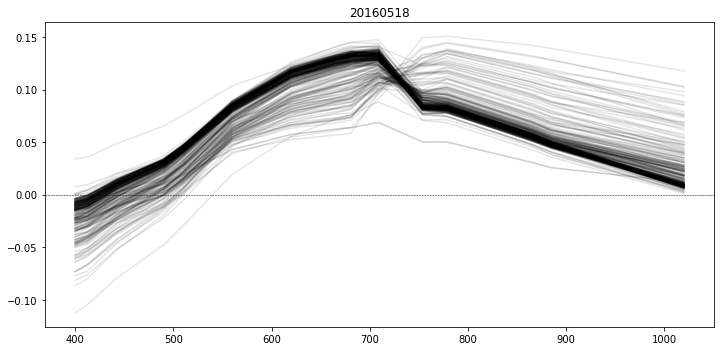

In [65]:
pltdata = radiometry[radiometry.columns[11:27]]
plt.title(f'{date}')
for n, i in enumerate(pltdata.iterrows()):
    plt.plot(list(ncxp.s3_bands_l2.values()),i[1].values, alpha=0.1, c='k')
plt.axhline(y=0, xmin=0, xmax=1, linewidth=0.5, color='black', linestyle='--')
plt.show()
plt.close()

In [66]:
# Oa16 must always be above Oa12, for Oa12 is an atmospheric attenuation window
# radiometry = radiometry[radiometry['B16-778.75'] > radiometry['B12-753.75']]

# Oa11 must always be higher than Oa12
radiometry = radiometry[radiometry['B11-708.75'] > radiometry['B12-753.75']]

In [67]:
len(radiometry)

255

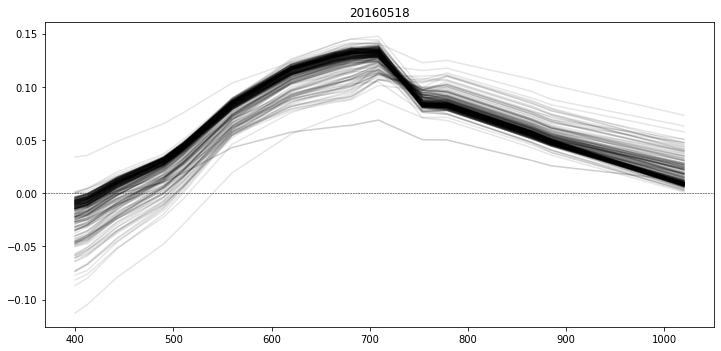

In [68]:
pltdata = radiometry[radiometry.columns[11:27]]
plt.title(f'{date}')
for n, i in enumerate(pltdata.iterrows()):
    plt.plot(list(ncxp.s3_bands_l2.values()),i[1].values, alpha=0.1, c='k')
plt.axhline(y=0, xmin=0, xmax=1, linewidth=0.5, color='black', linestyle='--')
plt.show()
plt.close()

No handles with labels found to put in legend.


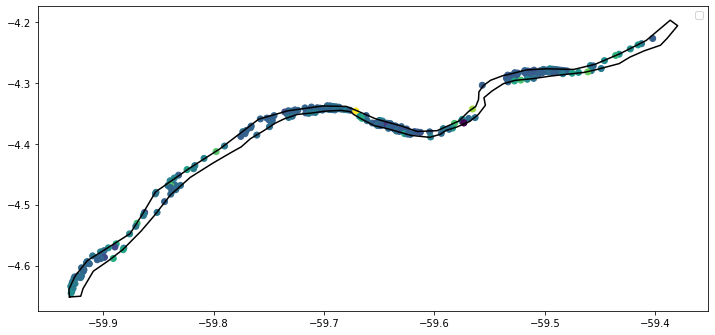

In [72]:
colors = {-1:'C0', 0:'C1', 1:'C2', 2:'C3', 3:'C4', 4:'C5', 5:'C6', 6:'C7', 7:'C8', 8:'C9'}

for vert in vertx:
    plt.plot(vert[:,0],vert[:,1],c='k')

    plt.scatter(radiometry['longitude:double'], radiometry['latitude:double'],c=radiometry['B17-865'])

plt.legend()
plt.show()

In [62]:
# MODIS-Terra
f_mod = '/d_drive_data/processing/OTHER_PLATFORMS/15860000_MOD09Q1_commun_noinf.xls'
df_mod = pd.read_excel(f_mod,sheet_name='MOD09Q1', converters={'Date': str})
df_mod['Date'] = df_mod['Nom'].apply(lambda x: datetime.datetime.strptime(x.split('_')[2][1:], '%Y%j').date())
df_mod_srtd = df_mod.sort_values(by='Date')
df_mod_srtd['Datetime'] = pd.to_datetime(df_mod_srtd['Date'], errors='coerce')

# MODIS-Aqua
f_myd = '/d_drive_data/processing/OTHER_PLATFORMS/15860000_MYD09Q1_commun_noinf.xls'
df_myd = pd.read_excel(f_myd,sheet_name='MYD09Q1', converters={'Date': str})
df_myd['Date'] = df_myd['Nom'].apply(lambda x: datetime.datetime.strptime(x.split('_')[2][1:], '%Y%j').date())
df_myd_srtd = df_myd.sort_values(by='Date')
df_myd_srtd['Datetime'] = pd.to_datetime(df_myd_srtd['Date'], errors='coerce')

# VIIRS
f_vir = '/d_drive_data/processing/OTHER_PLATFORMS/15860000_VNP09H1_commun_noinf.xls'
df_vir = pd.read_excel(f_vir,sheet_name='Report', converters={'Date': str})
df_vir['Date'] = df_vir['Nom'].apply(lambda x: datetime.datetime.strptime(x.split('_')[2][1:], '%Y%j').date())
df_vir_srtd = df_vir.sort_values(by='Date')
df_vir_srtd['Datetime'] = pd.to_datetime(df_vir_srtd['Date'], errors='coerce')

FileNotFoundError: [Errno 2] No such file or directory: '/d_drive_data/processing/OTHER_PLATFORMS/15860000_MOD09Q1_commun_noinf.xls'